# DIR (case2, sp50) Qualitative Comparison

This notebook visualizes **GT** and two baselines on the DIR dataset (case2, sp50):

- **FDK** (baseline step 1): computed directly from sparse projections in the `.pickle` using TIGRE.
- **R$^2$** (baseline at `iteration_5000`): loaded from a training output folder that saved `vol_pred_T*.npy`.

Later you can add **our method** and **x$^2$** by pointing to their corresponding `output/<run>/point_cloud/iteration_*/vol_pred_T*.npy`.


In [51]:
import pickle
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['figure.dpi'] = 120
plt.rcParams['image.cmap'] = 'gray'


In [52]:
# ------------------------
# Paths (edit if needed)
# ------------------------
pickle_path = Path('data/dir_4d_case2_sparse50.pickle')

# R^2 baseline output folder (must contain point_cloud/iteration_5000/vol_pred_T*.npy)
# Example candidate in this repo (adjust if you want a different baseline run):
#   output/20260125_sp50_case2_wt099_ds0_dr001_temporal/point_cloud/iteration_5000/vol_pred_T0.npy
r2_run_dir = Path('output/20260125_sp50_case2_wt099_ds0_dr001_temporal')
r2_iter = 5000

assert pickle_path.exists(), f'Missing pickle: {pickle_path}'
assert (r2_run_dir / 'point_cloud' / f'iteration_{r2_iter}').exists(), (
    f'Missing R^2 iteration folder: {r2_run_dir}/point_cloud/iteration_{r2_iter}'
)

print('pickle_path:', pickle_path)
print('r2_run_dir :', r2_run_dir)
print('r2_iter    :', r2_iter)


pickle_path: data/dir_4d_case2_sparse50.pickle
r2_run_dir : output/20260125_sp50_case2_wt099_ds0_dr001_temporal
r2_iter    : 5000


In [53]:
with open(pickle_path, 'rb') as f:
    data = pickle.load(f)

vol_gt = data['image']  # shape: [T, H, W, Z]
print('GT shape:', vol_gt.shape, 'dtype:', vol_gt.dtype, 'range:', float(vol_gt.min()), float(vol_gt.max()))

train = data['train']
print('train keys:', sorted(train.keys()))
print('train projections:', np.asarray(train['projections']).shape)
print('train angles:', np.asarray(train['angles']).shape)
print('train phase :', np.asarray(train['phase']).shape)


GT shape: (10, 256, 256, 112) dtype: float32 range: 0.0 1.0
train keys: ['angles', 'phase', 'projections', 'time']
train projections: (150, 512, 512)
train angles: (150,)
train phase : (150,)


In [54]:
def build_scaled_scanner_cfg_from_pickle(d: dict):
    """Match x2_gaussian/dataset/dataset_readers.py scaling for NAF(.pickle).

    The raw pickle stores scanner geometry in mm while projections are in meters.
    The training code scales the scene so the volume roughly fits [-1,1]^3.
    """
    # First convert mm->m
    scanner_cfg = {
        'DSD': d['DSD'] / 1000.0,
        'DSO': d['DSO'] / 1000.0,
        'nVoxel': d['nVoxel'],
        'dVoxel': (np.array(d['dVoxel']) / 1000.0).tolist(),
        'sVoxel': (np.array(d['nVoxel']) * np.array(d['dVoxel']) / 1000.0).tolist(),
        'nDetector': d['nDetector'],
        'dDetector': (np.array(d['dDetector']) / 1000.0).tolist(),
        'sDetector': (np.array(d['nDetector']) * np.array(d['dDetector']) / 1000.0).tolist(),
        'offOrigin': (np.array(d['offOrigin']) / 1000.0).tolist(),
        'offDetector': (np.array(d['offDetector']) / 1000.0).tolist(),
        'totalAngle': d['totalAngle'],
        'startAngle': d['startAngle'],
        'accuracy': d['accuracy'],
        'mode': d['mode'],
        'filter': None,
    }

    # scene scaling
    scene_scale = 2.0 / max(scanner_cfg['sVoxel'])
    for key_to_scale in [
        'dVoxel','sVoxel','sDetector','dDetector','offOrigin','offDetector','DSD','DSO'
    ]:
        scanner_cfg[key_to_scale] = (np.array(scanner_cfg[key_to_scale]) * scene_scale).tolist()

    return scanner_cfg, scene_scale

scanner_cfg, scene_scale = build_scaled_scanner_cfg_from_pickle(data)
print('scene_scale:', scene_scale)
print('scanner_cfg[mode]:', scanner_cfg['mode'])


scene_scale: 6.734913793103448
scanner_cfg[mode]: cone


In [55]:
# FDK reconstruction using TIGRE (baseline step 1)
try:
    import tigre
    import tigre.algorithms as algs
except Exception as e:
    raise RuntimeError(
        'TIGRE is required for FDK baseline in this notebook. '
        'Please ensure tigre is installed/available in this environment.'
    ) from e

def get_geometry_tigre(cfg: dict):
    # minimal copy from x2_gaussian/utils/ct_utils.py
    if cfg['mode'] == 'parallel':
        geo = tigre.geometry(mode='parallel', nVoxel=np.array(cfg['nVoxel'][::-1]))
    elif cfg['mode'] == 'cone':
        geo = tigre.geometry(mode='cone')
    else:
        raise NotImplementedError(f"Unsupported mode: {cfg['mode']}")

    geo.DSD = cfg['DSD']
    geo.DSO = cfg['DSO']
    geo.nDetector = np.array(cfg['nDetector'])
    geo.sDetector = np.array(cfg['sDetector'])
    geo.dDetector = geo.sDetector / geo.nDetector
    geo.nVoxel = np.array(cfg['nVoxel'][::-1])
    geo.sVoxel = np.array(cfg['sVoxel'][::-1])
    geo.dVoxel = geo.sVoxel / geo.nVoxel
    geo.offOrigin = np.array(cfg['offOrigin'][::-1])
    geo.offDetector = np.array([cfg['offDetector'][1], cfg['offDetector'][0], 0])
    geo.accuracy = cfg['accuracy']
    geo.filter = cfg.get('filter', None)
    return geo

geo = get_geometry_tigre(scanner_cfg)

def fdk_recon_for_phase(phase_idx: int):
    phases = np.asarray(train['phase'])
    projs = np.asarray(train['projections']) * scene_scale  # match dataset scaling
    angles = np.asarray(train['angles'])

    sel = np.where(phases == phase_idx)[0]
    if sel.size == 0:
        raise ValueError(f'No projections found for phase={phase_idx}')

    projs_sel = projs[sel]
    angles_sel = angles[sel]

    # Follow x2_gaussian/utils/ct_utils.py
    vol = algs.fdk(projs_sel[:, ::-1, :], geo, angles_sel)
    vol = np.transpose(vol, (2, 1, 0))
    return vol


In [56]:
def load_r2_pred_volume(phase_idx: int, run_dir: Path, iteration: int):
    p = run_dir / 'point_cloud' / f'iteration_{iteration}' / f'vol_pred_T{phase_idx}.npy'
    if not p.exists():
        raise FileNotFoundError(f'Missing R^2 prediction file: {p}')
    return np.load(p)

def pick_slice(vol, axis='z', index=None):
    assert vol.ndim == 3
    if axis == 'z':
        if index is None: index = vol.shape[2] // 2
        return vol[:, :, index]
    if axis == 'y':
        if index is None: index = vol.shape[1] // 2
        return vol[:, index, :]
    if axis == 'x':
        if index is None: index = vol.shape[0] // 2
        return vol[index, :, :]
    raise ValueError(axis)

def _enhance_for_display(img2d: np.ndarray, p_low=1.0, p_high=99.0, gamma=0.9):
    x = img2d.astype(np.float32)
    lo = np.percentile(x, p_low)
    hi = np.percentile(x, p_high)
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        y = np.clip(x, 0.0, 1.0)
    else:
        y = (x - lo) / (hi - lo)
        y = np.clip(y, 0.0, 1.0)
    if gamma is not None and gamma > 0:
        y = np.power(y, gamma)
    return y


def show_triplet(gt, fdk, r2, title_prefix='', vmin=0.0, vmax=1.0):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(_enhance_for_display(gt), vmin=0.0, vmax=1.0)
    axs[0].set_title(f'{title_prefix}GT')
    axs[1].imshow(_enhance_for_display(fdk), vmin=0.0, vmax=1.0)
    axs[1].set_title(f'{title_prefix}FDK')
    axs[2].imshow(_enhance_for_display(r2), vmin=0.0, vmax=1.0)
    axs[2].set_title(f'{title_prefix}R$^2$')
    for a in axs: a.axis('off')
    plt.tight_layout()
    plt.show()


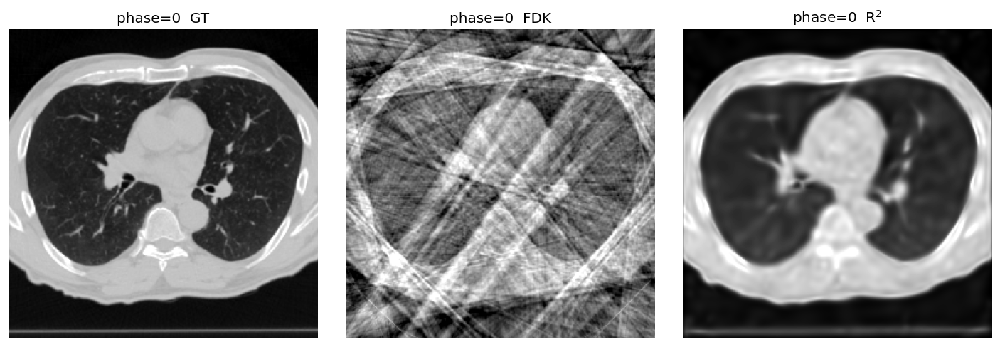

In [57]:
# Select which phase/time and which slice to visualize
phase_idx = 0  # 0..9
slice_axis = 'z'
slice_index = None  # None means middle

vol_gt_t = vol_gt[phase_idx]
vol_fdk_t = fdk_recon_for_phase(phase_idx)
vol_r2_t = load_r2_pred_volume(phase_idx, r2_run_dir, r2_iter)

gt_slice = pick_slice(vol_gt_t, axis=slice_axis, index=slice_index)
fdk_slice = pick_slice(vol_fdk_t, axis=slice_axis, index=slice_index)
r2_slice = pick_slice(vol_r2_t, axis=slice_axis, index=slice_index)

show_triplet(gt_slice, fdk_slice, r2_slice, title_prefix=f'phase={phase_idx}  ')


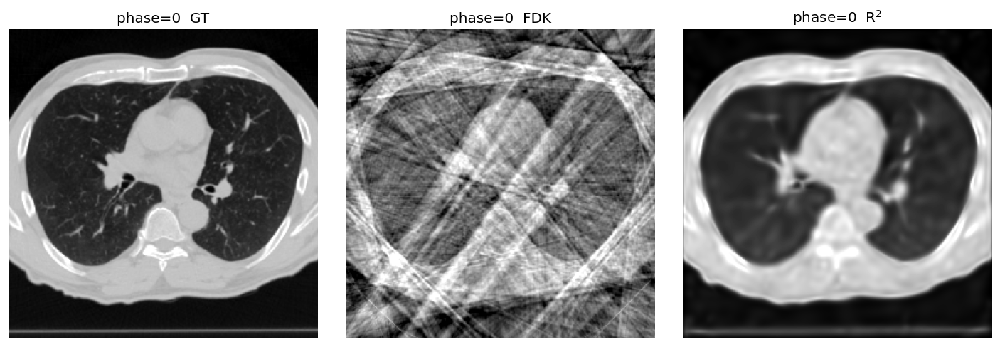

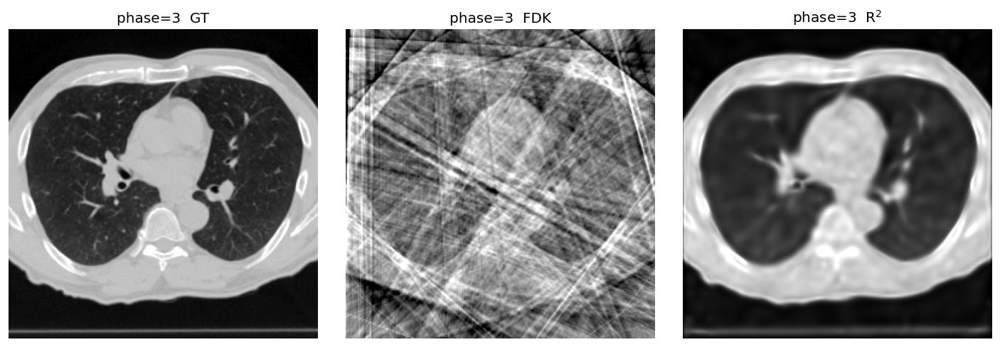

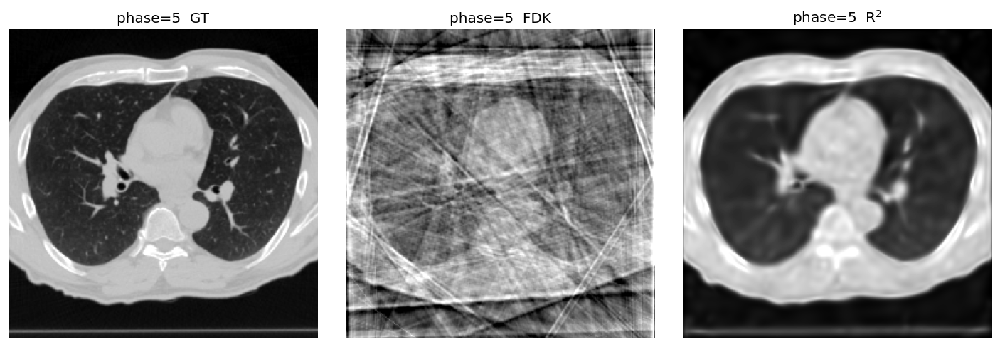

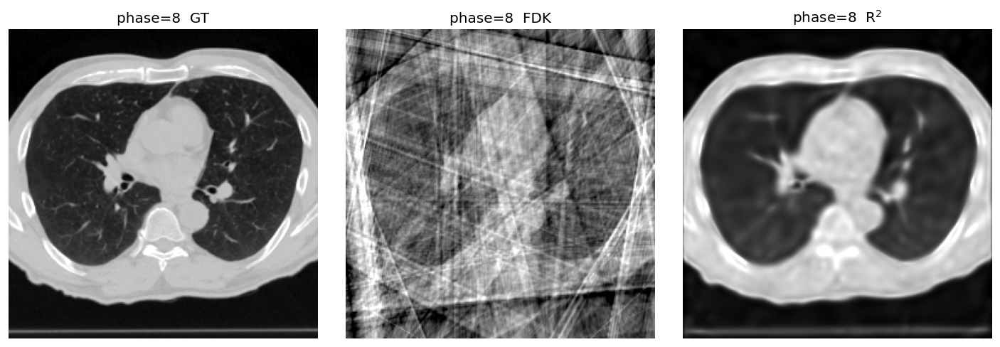

In [58]:
# Optional: visualize multiple phases for the same slice
phases_to_show = [0, 3, 5, 8]
slice_axis = 'z'
slice_index = None

for t in phases_to_show:
    vol_gt_t = vol_gt[t]
    vol_fdk_t = fdk_recon_for_phase(t)
    vol_r2_t = load_r2_pred_volume(t, r2_run_dir, r2_iter)

    gt_slice = pick_slice(vol_gt_t, axis=slice_axis, index=slice_index)
    fdk_slice = pick_slice(vol_fdk_t, axis=slice_axis, index=slice_index)
    r2_slice = pick_slice(vol_r2_t, axis=slice_axis, index=slice_index)

    show_triplet(gt_slice, fdk_slice, r2_slice, title_prefix=f'phase={t}  ')


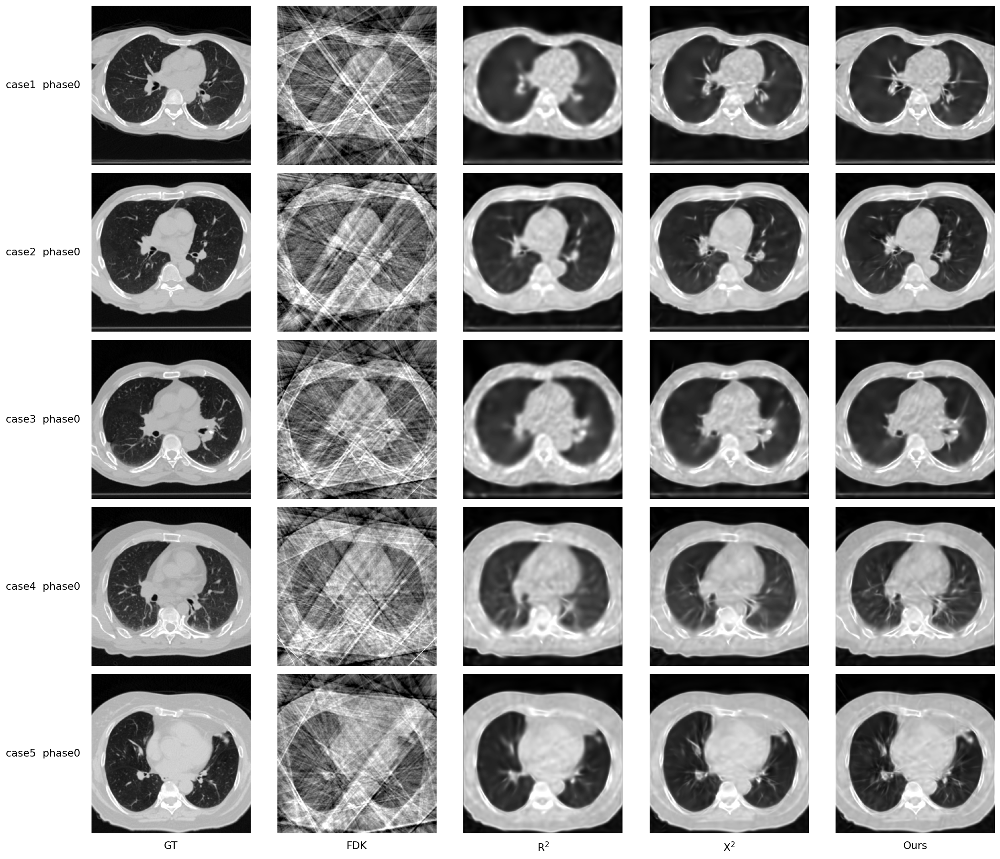

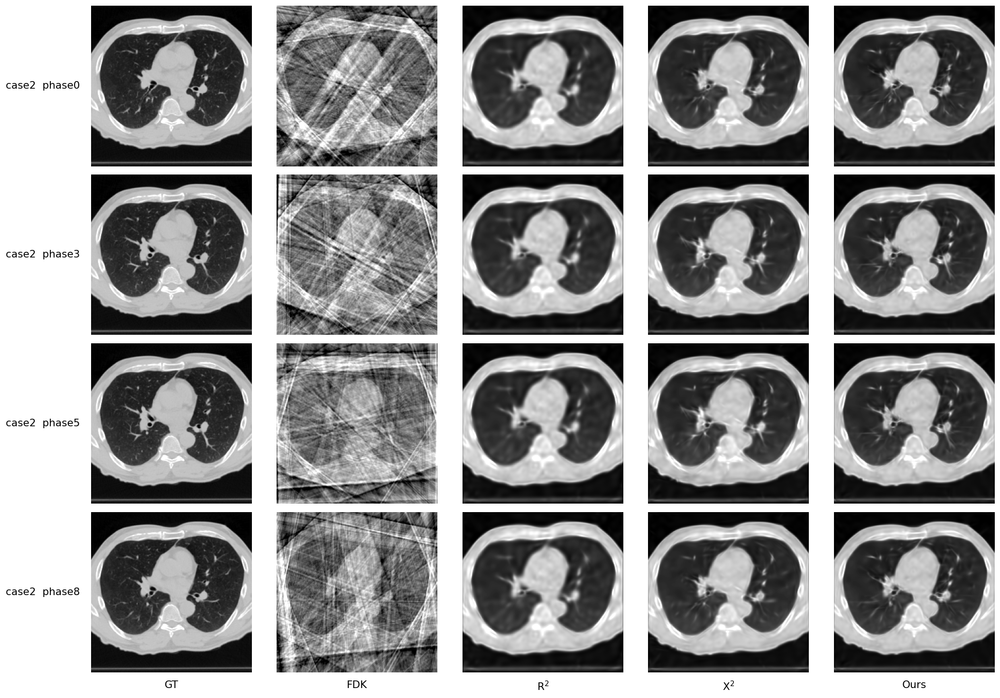

In [59]:
# ================================================
# Extended qualitative comparison: DIR case1--5
# Methods: GT / FDK / R^2 (baseline iter5000) / X^2 (baseline best saved) / Ours (np0ns0_A0)
# ================================================

from pathlib import Path

# Case configs from provided logs
case_cfgs = {
    1: {
        'pickle_path': Path('data/dir_4d_case1_sparse50.pickle'),
        'baseline_run_dir': Path('output/257b575c-5'),
        'ours_run_dir': Path('output/20260125_sp50_case1_np0ns0_A0_temporal'),
    },
    2: {
        'pickle_path': Path('data/dir_4d_case2_sparse50.pickle'),
        'baseline_run_dir': Path('output/da2919ee-8'),
        'ours_run_dir': Path('output/20260127_sp50_case2_np0ns0_A0_temporal'),
    },
    3: {
        'pickle_path': Path('data/dir_4d_case3_sparse50.pickle'),
        'baseline_run_dir': Path('output/bfb1824d-e'),
        'ours_run_dir': Path('output/20260127_sp50_case3_np0ns0_A0_temporal'),
    },
    4: {
        'pickle_path': Path('data/dir_4d_case4_sparse50.pickle'),
        'baseline_run_dir': Path('output/5795e03c-0'),
        'ours_run_dir': Path('output/20260127_sp50_case4_np0ns0_A0_temporal'),
    },
    5: {
        'pickle_path': Path('data/dir_4d_case5_sparse50.pickle'),
        'baseline_run_dir': Path('output/34a00bd1-5'),
        'ours_run_dir': Path('output/20260127_sp50_case5_np0ns0_A0_temporal'),
    },
}

# Selection rules for visualization (must exist on disk)
# - Baseline: iter5000 is treated as R^2; iter30000 is treated as X^2 (best saved)
# - Ours: iter60000 (np0ns0_A0) is used
r2_iter = 5000
x2_iter = 30000
ours_iter = 60000

for cid, cfg in case_cfgs.items():
    assert cfg['pickle_path'].exists(), f"Missing pickle for case{cid}: {cfg['pickle_path']}"
    assert (cfg['baseline_run_dir'] / 'point_cloud' / f'iteration_{r2_iter}').exists(), (
        f"Missing baseline R^2 folder for case{cid}: {cfg['baseline_run_dir']}/point_cloud/iteration_{r2_iter}"
    )
    assert (cfg['baseline_run_dir'] / 'point_cloud' / f'iteration_{x2_iter}').exists(), (
        f"Missing baseline X^2 folder for case{cid}: {cfg['baseline_run_dir']}/point_cloud/iteration_{x2_iter}"
    )
    assert (cfg['ours_run_dir'] / 'point_cloud' / f'iteration_{ours_iter}').exists(), (
        f"Missing ours folder for case{cid}: {cfg['ours_run_dir']}/point_cloud/iteration_{ours_iter}"
    )


def fdk_recon_for_phase_from_case(train_dict: dict, geo, scene_scale: float, phase_idx: int):
    phases = np.asarray(train_dict['phase'])
    projs = np.asarray(train_dict['projections']) * scene_scale
    angles = np.asarray(train_dict['angles'])

    sel = np.where(phases == phase_idx)[0]
    if sel.size == 0:
        raise ValueError(f'No projections found for phase={phase_idx}')

    projs_sel = projs[sel]
    angles_sel = angles[sel]

    vol = algs.fdk(projs_sel[:, ::-1, :], geo, angles_sel)
    vol = np.transpose(vol, (2, 1, 0))
    return vol


def load_pred_volume(phase_idx: int, run_dir: Path, iteration: int):
    p = run_dir / 'point_cloud' / f'iteration_{iteration}' / f'vol_pred_T{phase_idx}.npy'
    if not p.exists():
        raise FileNotFoundError(f'Missing prediction file: {p}')
    return np.load(p)


def _enhance_for_display(img2d: np.ndarray, p_low=1.0, p_high=99.0, gamma=0.9):
    x = img2d.astype(np.float32)
    lo = np.percentile(x, p_low)
    hi = np.percentile(x, p_high)
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        y = np.clip(x, 0.0, 1.0)
    else:
        y = (x - lo) / (hi - lo)
        y = np.clip(y, 0.0, 1.0)
    if gamma is not None and gamma > 0:
        y = np.power(y, gamma)
    return y


def show_row(images, titles, vmin=0.0, vmax=1.0, figsize=(18, 4)):
    assert len(images) == len(titles)
    fig, axs = plt.subplots(1, len(images), figsize=figsize)
    if len(images) == 1:
        axs = [axs]
    for ax, img, title in zip(axs, images, titles):
        ax.imshow(_enhance_for_display(img), vmin=0.0, vmax=1.0)
        # Stretch image to fill a square panel (no padding, not aspect-preserving)
        ax.set_aspect('auto')
        try:
            ax.set_box_aspect(1)
        except Exception:
            pass
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


# ------------------------
# Run qualitative panels
# ------------------------

save_dir = Path('.')

METHODS = ['GT', 'FDK', 'R$^2$', 'X$^2$', 'Ours']

def show_grid(images_grid, row_labels, col_labels, save_path: Path, figsize=None, row_fs=13, col_fs=13):
    nrows = len(images_grid)
    ncols = len(images_grid[0]) if nrows > 0 else 0
    assert all(len(r) == ncols for r in images_grid)
    if figsize is None:
        figsize = (3.6 * ncols, 3.0 * nrows + 0.9)
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize)
    if nrows == 1 and ncols == 1:
        axs = np.array([[axs]])
    elif nrows == 1:
        axs = np.array([axs])
    elif ncols == 1:
        axs = np.array([[a] for a in axs])

    for r in range(nrows):
        for c in range(ncols):
            ax = axs[r, c]
            ax.imshow(_enhance_for_display(images_grid[r][c]), vmin=0.0, vmax=1.0)
            ax.set_aspect('auto')
            try:
                ax.set_box_aspect(1)
            except Exception:
                pass
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_visible(False)

            # method names at bottom (last row only)
            if r == nrows - 1:
                ax.set_xlabel(col_labels[c], fontsize=col_fs, labelpad=10)

        # explicit left row label (case/phase)
        axs[r, 0].set_ylabel(row_labels[r], rotation=0, ha='right', va='center', fontsize=row_fs, labelpad=14)

    plt.tight_layout()
    fig.subplots_adjust(bottom=0.08, left=0.08)
    if str(save_path).lower().endswith('.pdf'):
        fig.savefig(save_path, bbox_inches='tight')
    else:
        fig.savefig(save_path, bbox_inches='tight', dpi=220)
    plt.show()


phase_idx = 0
slice_axis = 'z'
slice_index = None

# 1) Axial: case1~5 (single figure)
images_grid = []
row_labels = []
for cid, cfg in case_cfgs.items():
    with open(cfg['pickle_path'], 'rb') as f:
        data_c = pickle.load(f)

    vol_gt_c = data_c['image']
    train_c = data_c['train']

    scanner_cfg_c, scene_scale_c = build_scaled_scanner_cfg_from_pickle(data_c)
    geo_c = get_geometry_tigre(scanner_cfg_c)

    vol_gt_t = vol_gt_c[phase_idx]
    vol_fdk_t = fdk_recon_for_phase_from_case(train_c, geo_c, scene_scale_c, phase_idx)
    vol_r2_t = load_pred_volume(phase_idx, cfg['baseline_run_dir'], r2_iter)
    vol_x2_t = load_pred_volume(phase_idx, cfg['baseline_run_dir'], x2_iter)
    vol_ours_t = load_pred_volume(phase_idx, cfg['ours_run_dir'], ours_iter)

    gt_slice = pick_slice(vol_gt_t, axis=slice_axis, index=slice_index)
    fdk_slice = pick_slice(vol_fdk_t, axis=slice_axis, index=slice_index)
    r2_slice = pick_slice(vol_r2_t, axis=slice_axis, index=slice_index)
    x2_slice = pick_slice(vol_x2_t, axis=slice_axis, index=slice_index)
    ours_slice = pick_slice(vol_ours_t, axis=slice_axis, index=slice_index)

    images_grid.append([gt_slice, fdk_slice, r2_slice, x2_slice, ours_slice])
    row_labels.append(f'case{cid}  phase{phase_idx}')

save_path = save_dir / f'axial_case1-5_phase{phase_idx}_{slice_axis}.pdf'
show_grid(images_grid, row_labels, METHODS, save_path)


# 2) Axial: case2 multiple phases (single figure)
case_id = 2
phases_to_show = [0, 3, 5, 8]
images_grid = []
row_labels = []
cfg = case_cfgs[case_id]
with open(cfg['pickle_path'], 'rb') as f:
    data_c = pickle.load(f)
vol_gt_c = data_c['image']
train_c = data_c['train']
scanner_cfg_c, scene_scale_c = build_scaled_scanner_cfg_from_pickle(data_c)
geo_c = get_geometry_tigre(scanner_cfg_c)

for t in phases_to_show:
    vol_gt_t = vol_gt_c[t]
    vol_fdk_t = fdk_recon_for_phase_from_case(train_c, geo_c, scene_scale_c, t)
    vol_r2_t = load_pred_volume(t, cfg['baseline_run_dir'], r2_iter)
    vol_x2_t = load_pred_volume(t, cfg['baseline_run_dir'], x2_iter)
    vol_ours_t = load_pred_volume(t, cfg['ours_run_dir'], ours_iter)

    images_grid.append([
        pick_slice(vol_gt_t, axis=slice_axis, index=slice_index),
        pick_slice(vol_fdk_t, axis=slice_axis, index=slice_index),
        pick_slice(vol_r2_t, axis=slice_axis, index=slice_index),
        pick_slice(vol_x2_t, axis=slice_axis, index=slice_index),
        pick_slice(vol_ours_t, axis=slice_axis, index=slice_index),
    ])
    row_labels.append(f'case{case_id}  phase{t}')

save_path = save_dir / f'axial_case{case_id}_phases_{slice_axis}.pdf'
show_grid(images_grid, row_labels, METHODS, save_path)


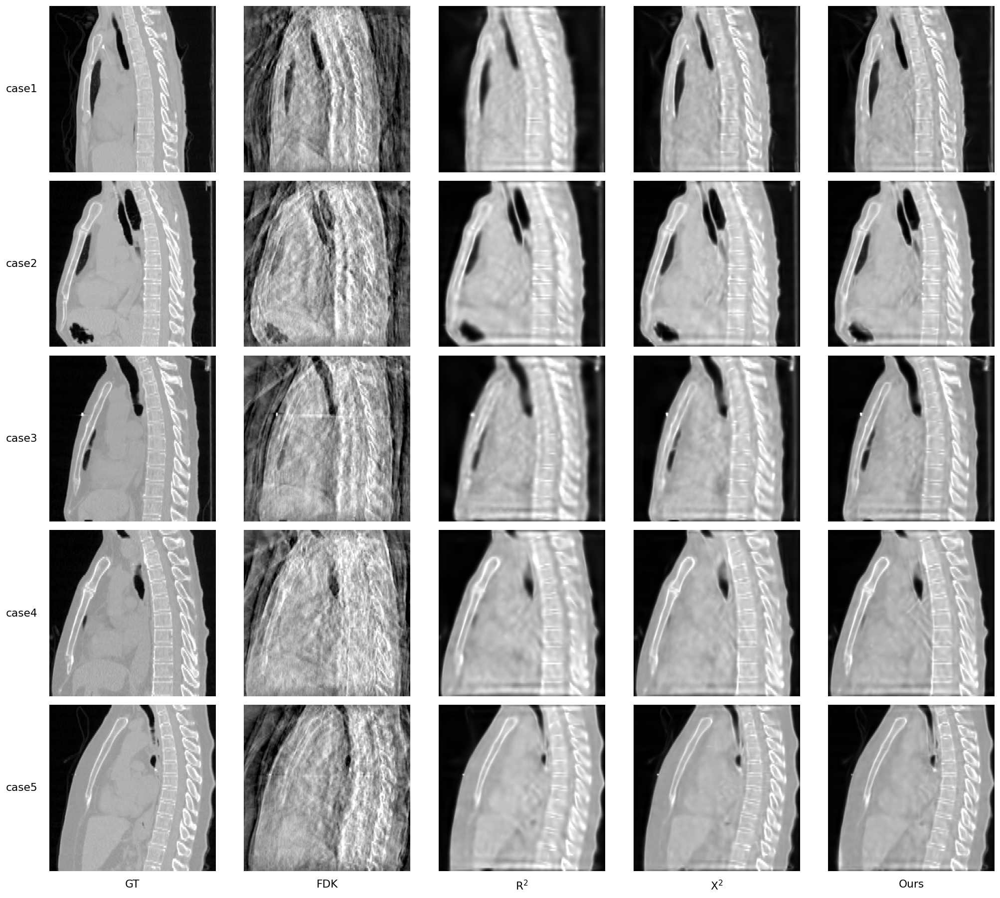

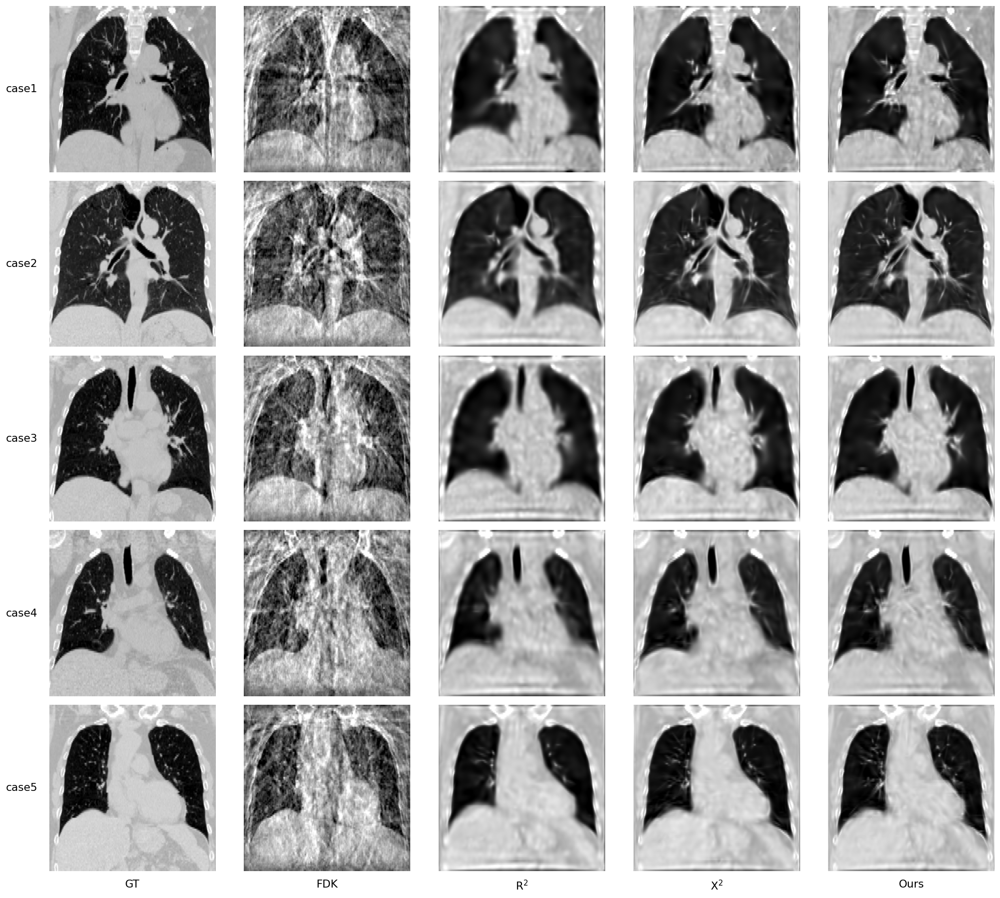

In [60]:
# ================================================
# Additional views: coronal (y) and sagittal (x)
# ================================================

save_dir = Path('.')

views = [
    ('y', 'coronal'),
    ('x', 'sagittal'),
]

phase_idx = 0
slice_index = None

for slice_axis, view_name in views:
    images_grid = []
    row_labels = []
    for cid, cfg in case_cfgs.items():
        with open(cfg['pickle_path'], 'rb') as f:
            data_c = pickle.load(f)

        vol_gt_c = data_c['image']
        train_c = data_c['train']

        scanner_cfg_c, scene_scale_c = build_scaled_scanner_cfg_from_pickle(data_c)
        geo_c = get_geometry_tigre(scanner_cfg_c)

        vol_gt_t = vol_gt_c[phase_idx]
        vol_fdk_t = fdk_recon_for_phase_from_case(train_c, geo_c, scene_scale_c, phase_idx)

        vol_r2_t = load_pred_volume(phase_idx, cfg['baseline_run_dir'], r2_iter)
        vol_x2_t = load_pred_volume(phase_idx, cfg['baseline_run_dir'], x2_iter)
        vol_ours_t = load_pred_volume(phase_idx, cfg['ours_run_dir'], ours_iter)

        gt_slice = pick_slice(vol_gt_t, axis=slice_axis, index=slice_index)
        fdk_slice = pick_slice(vol_fdk_t, axis=slice_axis, index=slice_index)
        r2_slice = pick_slice(vol_r2_t, axis=slice_axis, index=slice_index)
        x2_slice = pick_slice(vol_x2_t, axis=slice_axis, index=slice_index)
        ours_slice = pick_slice(vol_ours_t, axis=slice_axis, index=slice_index)

        if slice_axis in ('x', 'y'):
            gt_slice = np.rot90(gt_slice, k=1)
            fdk_slice = np.rot90(fdk_slice, k=1)
            r2_slice = np.rot90(r2_slice, k=1)
            x2_slice = np.rot90(x2_slice, k=1)
            ours_slice = np.rot90(ours_slice, k=1)

        images_grid.append([gt_slice, fdk_slice, r2_slice, x2_slice, ours_slice])
        row_labels.append(f'case{cid}')

    save_path = save_dir / f'{view_name}_case1-5_phase{phase_idx}.pdf'
    show_grid(images_grid, row_labels, METHODS, save_path)
